In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import seaborn as sns
import skimage

from sklearn.decomposition import PCA
from sklearn.manifold import Isomap

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

from sklearn.model_selection import cross_val_score, KFold, GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay

import warnings
warnings.filterwarnings("ignore")

Import image, change to grayscale and standardize:

In [4]:
chihuahua_train_directory = "train/chihuahua"
muffins_train_directory = "train/muffin"

chihuahua_test_directory = "test/chihuahua"
muffins_test_directory = "test/muffin"

target_size = (224, 224)

def extract_image_np(img_dir, target_size):
    output = []
    for filename in os.listdir(img_dir):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            image_path = os.path.join(img_dir, filename)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            if image is not None:
                resized_image = cv2.resize(image, target_size).flatten()
                output.append(np.array(resized_image))
    return np.array(output)
            
chihuahua_train = extract_image_np(chihuahua_train_directory, target_size)
muffins_train = extract_image_np(muffins_train_directory, target_size)
X_train = np.vstack((chihuahua_train, muffins_train))
y_train = np.hstack((np.ones(chihuahua_train.shape[0]), np.zeros(muffins_train.shape[0])))
X_train_scaled = X_train/255

chihuahua_test = extract_image_np(chihuahua_test_directory, target_size)
muffins_test = extract_image_np(muffins_test_directory, target_size)
X_test = np.vstack((chihuahua_test, muffins_test))
y_test = np.hstack((np.ones(chihuahua_test.shape[0]), np.zeros(muffins_test.shape[0])))
X_test_scaled = X_test/255

Display some transformed images for vizualization:

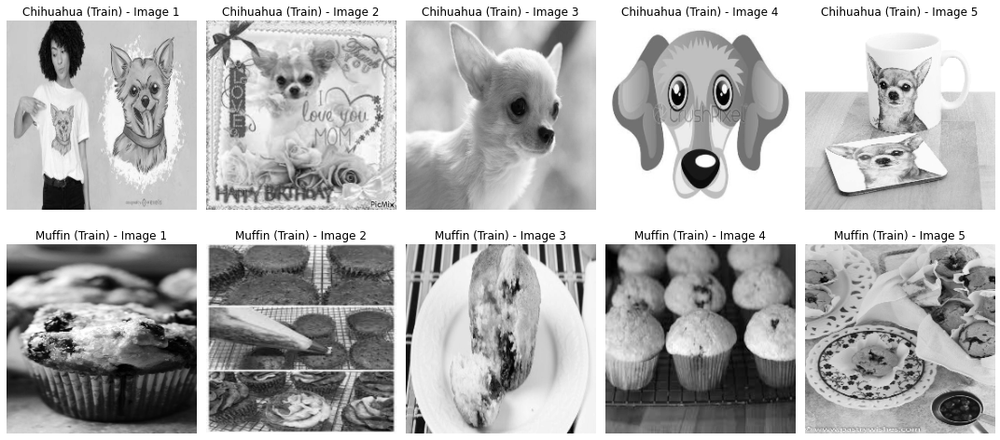

In [3]:
np.random.seed(42)

chihuahua_train_examples = chihuahua_train[np.random.choice(chihuahua_train.shape[0], 5, replace=False)]/255
muffins_train_examples = muffins_train[np.random.choice(muffins_train.shape[0], 5, replace=False)]/255

fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(5):
    axes[0, i].imshow(chihuahua_train_examples[i].reshape((224,224)), cmap='gray')
    axes[0, i].axis('off')
    axes[0, i].set_title(f'Chihuahua (Train) - Image {i+1}')

for i in range(5):
    axes[1, i].imshow(muffins_train_examples[i].reshape((224,224)), cmap='gray')
    axes[1, i].axis('off')
    axes[1, i].set_title(f'Muffin (Train) - Image {i+1}')

plt.tight_layout()
plt.show()

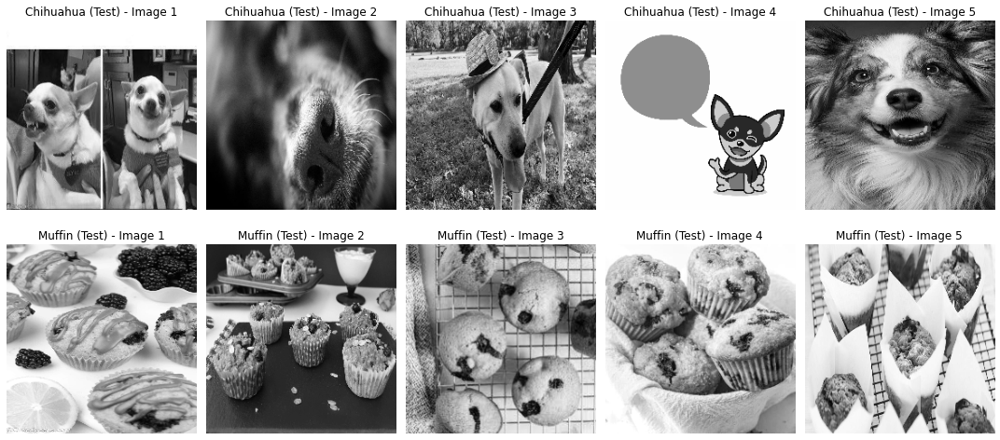

In [4]:
np.random.seed(42)

chihuahua_test_examples = chihuahua_test[np.random.choice(chihuahua_test.shape[0], 5, replace=False)]/255
muffins_test_examples = muffins_test[np.random.choice(muffins_test.shape[0], 5, replace=False)]/255

fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(5):
    axes[0, i].imshow(chihuahua_test_examples[i].reshape((224,224)), cmap='gray')
    axes[0, i].axis('off')
    axes[0, i].set_title(f'Chihuahua (Test) - Image {i+1}')

for i in range(5):
    axes[1, i].imshow(muffins_test_examples[i].reshape((224,224)), cmap='gray')
    axes[1, i].axis('off')
    axes[1, i].set_title(f'Muffin (Test) - Image {i+1}')

plt.tight_layout()
plt.show()

Plotting the distribution of training set using the first two components of PCA and isomap:

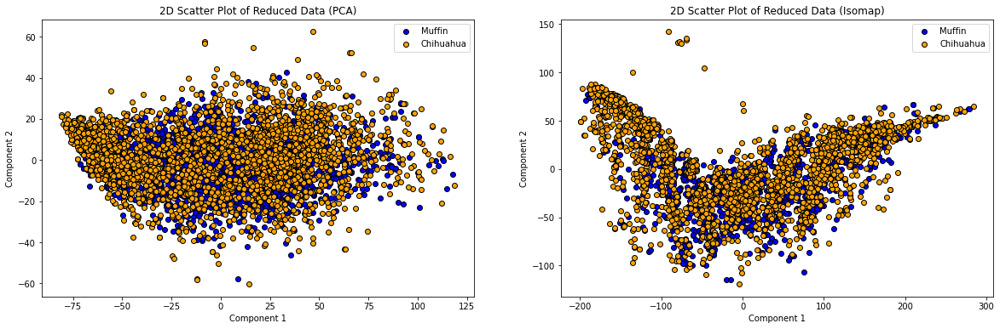

In [5]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))

pca = PCA()
pca.fit(X_train_scaled)
pca_reduced_data = pca.transform(X_train_scaled)[:, :2]

isomap = Isomap(n_components=2)
isomap_reduced_data = isomap.fit_transform(X_train_scaled)

ax1.scatter(pca_reduced_data[:, 0][y_train == 0], pca_reduced_data[:, 1][y_train == 0], edgecolors= "black", label='Muffin', color = 'blue')
ax1.scatter(pca_reduced_data[:, 0][y_train == 1], pca_reduced_data[:, 1][y_train == 1], edgecolors= "black", label='Chihuahua', color = 'orange')
ax1.set_title('2D Scatter Plot of Reduced Data (PCA)')
ax1.set(xlabel = 'Component 1', ylabel = 'Component 2')
ax1.legend()

ax2.scatter(isomap_reduced_data[:, 0][y_train == 0], isomap_reduced_data[:, 1][y_train == 0], edgecolors= "black", label='Muffin', color = 'blue')
ax2.scatter(isomap_reduced_data[:, 0][y_train == 1], isomap_reduced_data[:, 1][y_train == 1], edgecolors= "black", label='Chihuahua', color = 'orange')
ax2.set_title('2D Scatter Plot of Reduced Data (Isomap)')
ax2.set(xlabel = 'Component 1', ylabel = 'Component 2')
ax2.legend()

plt.show()

Finding the cummulative explained variance for PCA:

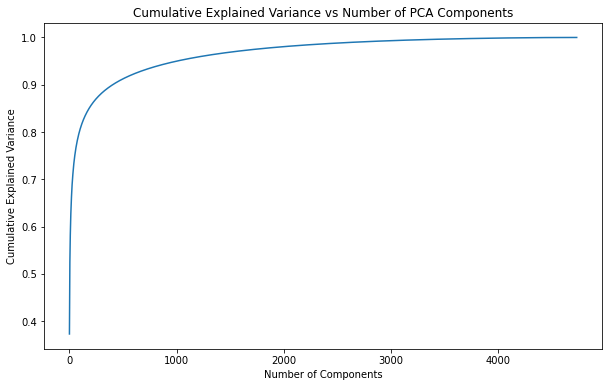

In [6]:
plt.figure(figsize=(10,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Cumulative Explained Variance vs Number of PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [7]:
pca_df = pd.DataFrame(data = [2, 5, 51, 405, 1003, 2659, 4733], columns = ['pca_components'])
pca_df['explained_var'] = pca_df['pca_components'].apply(lambda x: sum(pca.explained_variance_ratio_[:x]))
pca_df

,pca_components,explained_var
0,2,0.420521
1,5,0.523906
2,51,0.750289
3,405,0.900112
4,1003,0.950009
5,2659,0.990000
6,4733,1.000000


Define the classifiers used:

In [8]:
classifiers = {
    'Bayes Classifier': GaussianNB(),
    'k-Nearest Neighbors': KNeighborsClassifier(n_neighbors=5),
    'Logistic Regression': LogisticRegression(max_iter = 10000, random_state=42),
    'RBF SVM': SVC(kernel='rbf', random_state=42),
    'Neural Network': MLPClassifier(max_iter=500, random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'Naive Bayes': GaussianNB(),
    'Quadratic Discriminant Analysis': QuadraticDiscriminantAnalysis()
}

Model Evaluation using PCA components:

In [9]:
pca_results_df = pd.DataFrame(data = classifiers.keys(), columns = ['Classifiers'])
pca_time_df = pd.DataFrame(data = classifiers.keys(), columns = ['Classifiers'])
pca_reduced_data = pca.transform(X_train_scaled)

for i in [2, 5, 51, 405, 1003, 2659]:
    pca_X = pca_reduced_data[:, :i]
    clf_results = []
    times = []
    for name, clf in classifiers.items():
        start_time = time.time()
        kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
        cv_results = cross_val_score(clf, pca_X, y_train, cv=kfold, scoring='accuracy')
        clf_results.append(round(np.mean(cv_results),3))
        times.append(round(time.time()-start_time,2))
    pca_results_df[f'Mean Accuracy (n_components = {i})'] = clf_results
    pca_time_df[f'Time taken (s) (n_components = {i})'] = times

display(pca_results_df)
display(pca_time_df)

,Classifiers,Mean Accuracy (n_components = 2),Mean Accuracy (n_components = 5),Mean Accuracy (n_components = 51),Mean Accuracy (n_components = 405),Mean Accuracy (n_components = 1003),Mean Accuracy (n_components = 2659)
0,Bayes Classifier,0.637,0.659,0.666,0.657,0.664,0.698
1,k-Nearest Neighbors,0.622,0.676,0.664,0.584,0.567,0.559
2,Logistic Regression,0.558,0.582,0.608,0.607,0.594,0.590
3,RBF SVM,0.658,0.702,0.753,0.762,0.765,0.772
4,Neural Network,0.649,0.690,0.744,0.729,0.701,0.687
5,Decision Tree,0.585,0.644,0.640,0.633,0.650,0.629
6,AdaBoost,0.645,0.660,0.681,0.695,0.698,0.703
7,Naive Bayes,0.637,0.659,0.666,0.657,0.664,0.698
8,Quadratic Discriminant Analysis,0.637,0.687,0.747,0.776,0.728,0.580


,Classifiers,Time taken (s) (n_components = 2),Time taken (s) (n_components = 5),Time taken (s) (n_components = 51),Time taken (s) (n_components = 405),Time taken (s) (n_components = 1003),Time taken (s) (n_components = 2659)
0,Bayes Classifier,0.02,0.02,0.03,0.22,0.50,1.37
1,k-Nearest Neighbors,0.11,0.14,0.17,0.31,0.55,1.15
2,Logistic Regression,0.04,0.10,0.20,0.99,8.57,89.30
3,RBF SVM,4.48,4.01,5.48,14.09,51.51,141.76
4,Neural Network,5.53,14.69,69.31,30.58,37.19,103.63
5,Decision Tree,0.11,0.22,1.90,16.06,43.50,130.96
6,AdaBoost,1.04,1.58,9.94,74.94,194.08,527.98
7,Naive Bayes,0.01,0.01,0.03,0.22,0.53,1.33
8,Quadratic Discriminant Analysis,0.03,0.01,0.24,4.51,20.34,93.33


Model Evaluation using Isomap components:

In [10]:
isomap_results_df = pd.DataFrame(data = classifiers.keys(), columns = ['Classifiers'])
isomap_time_df = pd.DataFrame(data = classifiers.keys(), columns = ['Classifiers'])

for i in [2, 10, 100, 1000, 2000]:
    isomap = Isomap(n_components=i)
    isomap_X = isomap.fit_transform(X_train_scaled)
    clf_results = []
    times = []
    for name, clf in classifiers.items():
        start_time = time.time()
        kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
        cv_results = cross_val_score(clf, isomap_X, y_train, cv=kfold, scoring='accuracy')
        clf_results.append(round(np.mean(cv_results),3))
        times.append(round(time.time()-start_time,2))
    isomap_results_df[f'Mean Accuracy (n_components = {i})'] = clf_results
    isomap_time_df[f'Time taken (s) (n_components = {i})'] = times

display(isomap_results_df)
display(isomap_time_df)

,Classifiers,Mean Accuracy (n_components = 2),Mean Accuracy (n_components = 10),Mean Accuracy (n_components = 100),Mean Accuracy (n_components = 1000),Mean Accuracy (n_components = 2000)
0,Bayes Classifier,0.625,0.644,0.576,0.604,0.637
1,k-Nearest Neighbors,0.658,0.684,0.685,0.667,0.646
2,Logistic Regression,0.613,0.637,0.700,0.663,0.602
3,RBF SVM,0.646,0.673,0.720,0.731,0.735
4,Neural Network,0.629,0.667,0.701,0.669,0.675
5,Decision Tree,0.615,0.645,0.641,0.619,0.613
6,AdaBoost,0.645,0.668,0.686,0.673,0.661
7,Naive Bayes,0.625,0.644,0.576,0.604,0.637
8,Quadratic Discriminant Analysis,0.611,0.627,0.683,0.704,0.541


,Classifiers,Time taken (s) (n_components = 2),Time taken (s) (n_components = 10),Time taken (s) (n_components = 100),Time taken (s) (n_components = 1000),Time taken (s) (n_components = 2000)
0,Bayes Classifier,0.01,0.02,0.06,0.60,1.32
1,k-Nearest Neighbors,0.10,0.16,0.19,0.60,1.16
2,Logistic Regression,0.05,0.13,0.34,6.19,111.47
3,RBF SVM,4.71,4.33,6.00,51.47,103.72
4,Neural Network,3.70,13.74,33.25,45.78,98.38
5,Decision Tree,0.09,0.36,3.42,39.15,85.61
6,AdaBoost,1.02,2.50,19.79,198.98,395.02
7,Naive Bayes,0.01,0.01,0.08,0.56,1.24
8,Quadratic Discriminant Analysis,0.01,0.02,0.77,20.57,69.49


Sample images from Max Pooling:

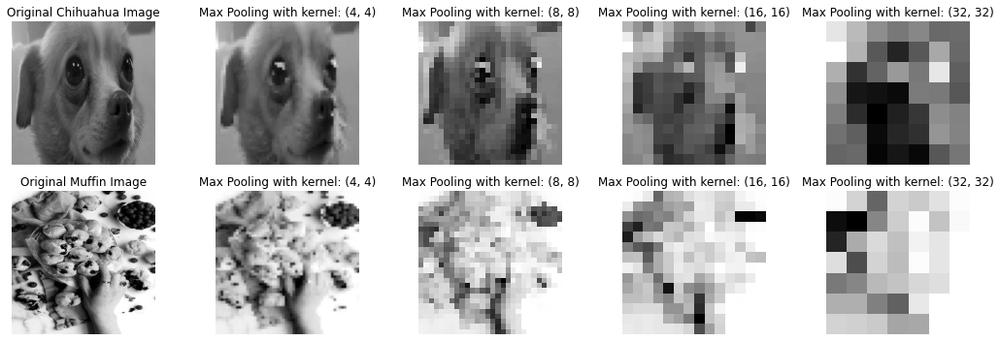

In [11]:
import skimage.measure
image_index = 1056
kernels = [(1,1), (4,4), (8,8), (16,16), (32,32)]

fig, axes = plt.subplots(2, len(kernels), figsize=(15, 5))

for index, kernel in enumerate(kernels):
    X_train_scaled_pooled = np.array([skimage.measure.block_reduce(i, kernel, np.max).flatten() for i in X_train_scaled.reshape((X_train_scaled.shape[0],224,224))])
    
    axes[0, index].imshow(X_train_scaled_pooled[image_index].reshape((224//kernel[0],224//kernel[1])), cmap='gray')
    axes[0, index].axis('off')
    if kernel == (1,1):
        axes[0, index].set_title(f'Original Chihuahua Image')
    else:
        axes[0, index].set_title(f'Max Pooling with kernel: {kernel}')
    
    axes[1, index].imshow(X_train_scaled_pooled[image_index+1700].reshape((224//kernel[0],224//kernel[1])), cmap='gray')
    axes[1, index].axis('off')  
    if kernel == (1,1):
        axes[1, index].set_title(f'Original Muffin Image')
    else:
        axes[1, index].set_title(f'Max Pooling with kernel: {kernel}')

plt.tight_layout()
plt.show()

Model Evaluation using Max Pooling:

In [12]:
kernels = [(32,32), (16,16), (8,8), (4,4)]

kernel_results_df = pd.DataFrame(data = classifiers.keys(), columns = ['Classifiers'])
kernel_time_df = pd.DataFrame(data = classifiers.keys(), columns = ['Classifiers'])

for kernel in kernels:
    X_train_scaled_pooled = np.array([skimage.measure.block_reduce(i, kernel, np.max).flatten() for i in X_train_scaled.reshape((X_train_scaled.shape[0],224,224))])
    clf_results = []
    times = []
    for name, clf in classifiers.items():
        start_time = time.time()
        kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
        cv_results = cross_val_score(clf, X_train_scaled_pooled, y_train, cv=kfold, scoring='accuracy')
        clf_results.append(round(np.mean(cv_results),3))
        times.append(round(time.time()-start_time,2))
    kernel_results_df[f'Mean Accuracy (kernel = {kernel})'] = clf_results
    kernel_time_df[f'Time taken (s) (kernel = {kernel})'] = times

display(kernel_results_df)
display(kernel_time_df)

,Classifiers,"Mean Accuracy (kernel = (32, 32))","Mean Accuracy (kernel = (16, 16))","Mean Accuracy (kernel = (8, 8))","Mean Accuracy (kernel = (4, 4))"
0,Bayes Classifier,0.586,0.582,0.573,0.650
1,k-Nearest Neighbors,0.691,0.625,0.577,0.558
2,Logistic Regression,0.555,0.566,0.568,0.586
3,RBF SVM,0.741,0.750,0.758,0.766
4,Neural Network,0.685,0.694,0.691,0.637
5,Decision Tree,0.680,0.666,0.671,0.666
6,AdaBoost,0.726,0.710,0.689,0.685
7,Naive Bayes,0.586,0.582,0.573,0.650
8,Quadratic Discriminant Analysis,0.606,0.739,0.734,0.537


,Classifiers,"Time taken (s) (kernel = (32, 32))","Time taken (s) (kernel = (16, 16))","Time taken (s) (kernel = (8, 8))","Time taken (s) (kernel = (4, 4))"
0,Bayes Classifier,0.03,0.11,0.43,1.70
1,k-Nearest Neighbors,0.18,0.26,0.46,1.29
2,Logistic Regression,0.53,1.51,10.67,124.26
3,RBF SVM,5.55,8.87,39.79,162.64
4,Neural Network,57.59,94.79,174.00,678.77
5,Decision Tree,1.03,4.65,21.67,94.40
6,AdaBoost,4.74,18.77,82.53,347.01
7,Naive Bayes,0.03,0.10,0.42,1.59
8,Quadratic Discriminant Analysis,0.23,1.78,14.02,120.73


Sample Images from Average Pooling:

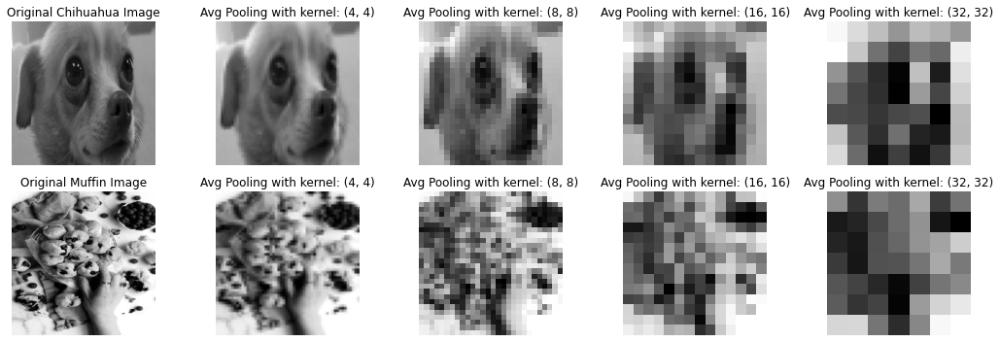

In [13]:
import skimage.measure
image_index = 1056
kernels = [(1,1), (4,4), (8,8), (16,16), (32,32)]

fig, axes = plt.subplots(2, len(kernels), figsize=(15, 5))

for index, kernel in enumerate(kernels):
    X_train_scaled_avg_pooled = np.array([skimage.measure.block_reduce(i, kernel, np.mean).flatten() for i in X_train_scaled.reshape((X_train_scaled.shape[0],224,224))])
    
    axes[0, index].imshow(X_train_scaled_avg_pooled[image_index].reshape((224//kernel[0],224//kernel[1])), cmap='gray')
    axes[0, index].axis('off')
    if kernel == (1,1):
        axes[0, index].set_title(f'Original Chihuahua Image')
    else:
        axes[0, index].set_title(f'Avg Pooling with kernel: {kernel}')
    
    axes[1, index].imshow(X_train_scaled_avg_pooled[image_index+1700].reshape((224//kernel[0],224//kernel[1])), cmap='gray')
    axes[1, index].axis('off')  
    if kernel == (1,1):
        axes[1, index].set_title(f'Original Muffin Image')
    else:
        axes[1, index].set_title(f'Avg Pooling with kernel: {kernel}')

plt.tight_layout()
plt.show()

Model Evaluation using Average Pooling:

In [14]:
kernels = [(32,32), (16,16), (8,8), (4,4)]

kernel_avg_results_df = pd.DataFrame(data = classifiers.keys(), columns = ['Classifiers'])
kernel_avg_time_df = pd.DataFrame(data = classifiers.keys(), columns = ['Classifiers'])

for kernel in kernels:
    X_train_scaled_pooled = np.array([skimage.measure.block_reduce(i, kernel, np.mean).flatten() for i in X_train_scaled.reshape((X_train_scaled.shape[0],224,224))])
    clf_results = []
    times = []
    for name, clf in classifiers.items():
        start_time = time.time()
        kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
        cv_results = cross_val_score(clf, X_train_scaled_pooled, y_train, cv=kfold, scoring='accuracy')
        clf_results.append(round(np.mean(cv_results),3))
        times.append(round(time.time()-start_time,2))
    kernel_avg_results_df[f'Mean Accuracy (kernel = {kernel})'] = clf_results
    kernel_avg_time_df[f'Time taken (s) (kernel = {kernel})'] = times

display(kernel_avg_results_df)
display(kernel_avg_time_df)

,Classifiers,"Mean Accuracy (kernel = (32, 32))","Mean Accuracy (kernel = (16, 16))","Mean Accuracy (kernel = (8, 8))","Mean Accuracy (kernel = (4, 4))"
0,Bayes Classifier,0.622,0.610,0.595,0.585
1,k-Nearest Neighbors,0.667,0.620,0.592,0.569
2,Logistic Regression,0.611,0.615,0.605,0.593
3,RBF SVM,0.741,0.756,0.760,0.766
4,Neural Network,0.742,0.740,0.729,0.683
5,Decision Tree,0.655,0.655,0.675,0.667
6,AdaBoost,0.676,0.665,0.675,0.663
7,Naive Bayes,0.622,0.610,0.595,0.585
8,Quadratic Discriminant Analysis,0.749,0.766,0.745,0.554


,Classifiers,"Time taken (s) (kernel = (32, 32))","Time taken (s) (kernel = (16, 16))","Time taken (s) (kernel = (8, 8))","Time taken (s) (kernel = (4, 4))"
0,Bayes Classifier,0.04,0.10,0.43,1.67
1,k-Nearest Neighbors,0.17,0.23,0.47,1.37
2,Logistic Regression,0.51,1.38,11.07,115.01
3,RBF SVM,5.38,8.19,39.31,163.69
4,Neural Network,101.59,119.90,209.28,816.72
5,Decision Tree,1.86,7.50,29.55,121.72
6,AdaBoost,9.79,37.53,147.42,555.57
7,Naive Bayes,0.03,0.11,0.41,1.67
8,Quadratic Discriminant Analysis,0.23,1.77,14.11,121.11


Information for hyperparameter tuning:

In [5]:
kernel = (8,8)
X_train_scaled_apooled = np.array([skimage.measure.block_reduce(i, kernel, np.mean).flatten() for i in X_train_scaled.reshape((X_train_scaled.shape[0],224,224))])
X_test_scaled_apooled = np.array([skimage.measure.block_reduce(i, kernel, np.mean).flatten() for i in X_test_scaled.reshape((X_test_scaled.shape[0],224,224))])

cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

Tuning SVM:

In [16]:
svm_param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], 'gamma': [0.001, 0.01, 0.1, 1, 10, 100, 100]}

svm_model = SVC(kernel='rbf')
svm_grid_search = GridSearchCV(svm_model, svm_param_grid, scoring='accuracy', cv=cv, n_jobs=-1)
svm_grid_search.fit(X_train_scaled_apooled, y_train)

best_svm_params = svm_grid_search.best_params_

svm_final_model = SVC(kernel='rbf', C=best_svm_params['C'], gamma=best_svm_params['gamma'])
svm_final_model.fit(X_train_scaled_apooled, y_train)

svm_best_accuracy = svm_grid_search.best_score_
print(f'Best Hyperparameters: {best_svm_params}')
print(f'Best Cross-Validation Accuracy: {svm_best_accuracy}')

svm_preds = svm_final_model.predict(X_test_scaled_apooled)
svm_test_accuracy = accuracy_score(y_test, svm_preds)
print(f'SVM test accuracy: {svm_test_accuracy}')

Best Hyperparameters: {'C': 10, 'gamma': 0.01}
Best Cross-Validation Accuracy: 0.7682264208169419
SVM test accuracy: 0.7719594594594594


In [17]:
pd.DataFrame({'Hyperparameters': [f"C = {i['C']}, gamma = {i['gamma']}" for i in svm_grid_search.cv_results_['params']],
              'Accuracy': svm_grid_search.cv_results_['mean_test_score']}).sort_values('Accuracy', ascending = False).head(5)

,Hyperparameters,Accuracy
29,"C = 10, gamma = 0.01",0.768226
43,"C = 1000, gamma = 0.01",0.745405
36,"C = 100, gamma = 0.01",0.744982
22,"C = 1, gamma = 0.01",0.743503
44,"C = 1000, gamma = 0.1",0.739505


Tuning QDA:

In [6]:
qda_param_grid = {'reg_param': np.arange(0, 2.1, 0.1)}

qda_model = QuadraticDiscriminantAnalysis()
qda_grid_search = GridSearchCV(qda_model, qda_param_grid, scoring='accuracy', cv=cv, n_jobs=-1)
qda_grid_search.fit(X_train_scaled_apooled, y_train)

qda_best_params = qda_grid_search.best_params_

qda_final_model = QuadraticDiscriminantAnalysis(reg_param=qda_best_params['reg_param'])
qda_final_model.fit(X_train_scaled_apooled, y_train)

qda_best_accuracy = qda_grid_search.best_score_
print(f'Best Hyperparameters: {qda_best_params}')
print(f'Best Cross-Validation Accuracy: {qda_best_accuracy}')

qda_preds = qda_final_model.predict(X_test_scaled_apooled)
qda_test_accuracy = accuracy_score(y_test, qda_preds)
print(f'QDA test accuracy: {qda_test_accuracy}')

Best Hyperparameters: {'reg_param': 0.0}
Best Cross-Validation Accuracy: 0.7451994183816381
QDA test accuracy: 0.7609797297297297


In [7]:
pd.DataFrame({'Hyperparameters': [f"reg_param = {i['reg_param']}" for i in qda_grid_search.cv_results_['params']],
              'Accuracy': qda_grid_search.cv_results_['mean_test_score']}).sort_values('Accuracy', ascending = False).head(5)

,Hyperparameters,Accuracy
0,reg_param = 0.0,0.745199
8,reg_param = 0.8,0.644410
9,reg_param = 0.9,0.634904
7,reg_param = 0.7000000000000001,0.634270
6,reg_param = 0.6000000000000001,0.621590


False Positive (138)


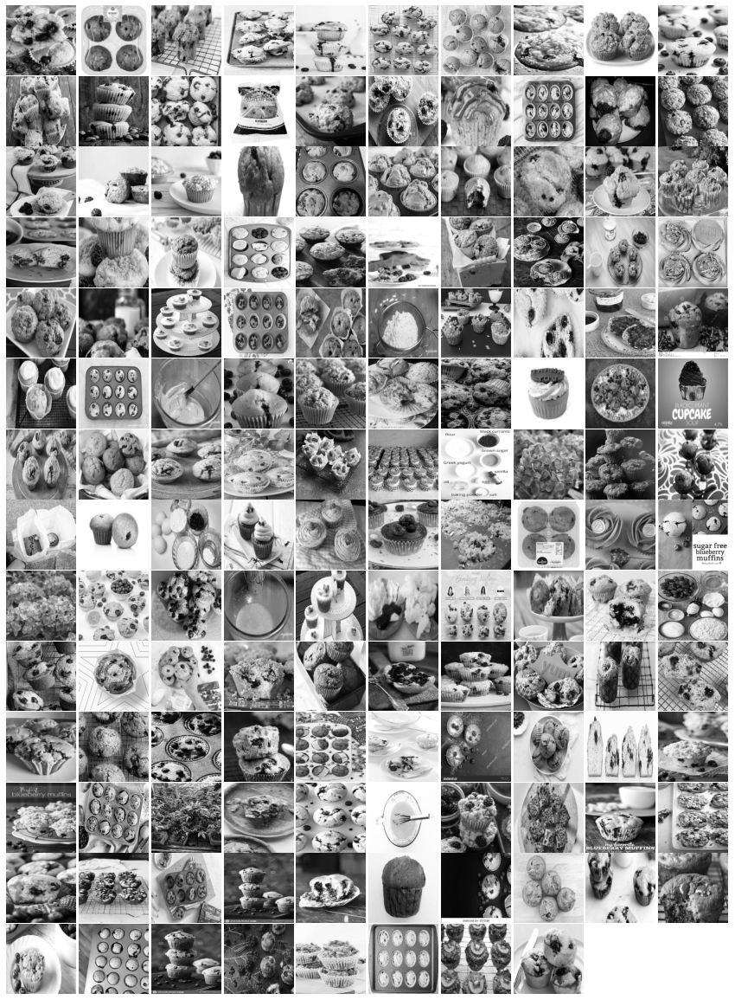

False Negative (132)


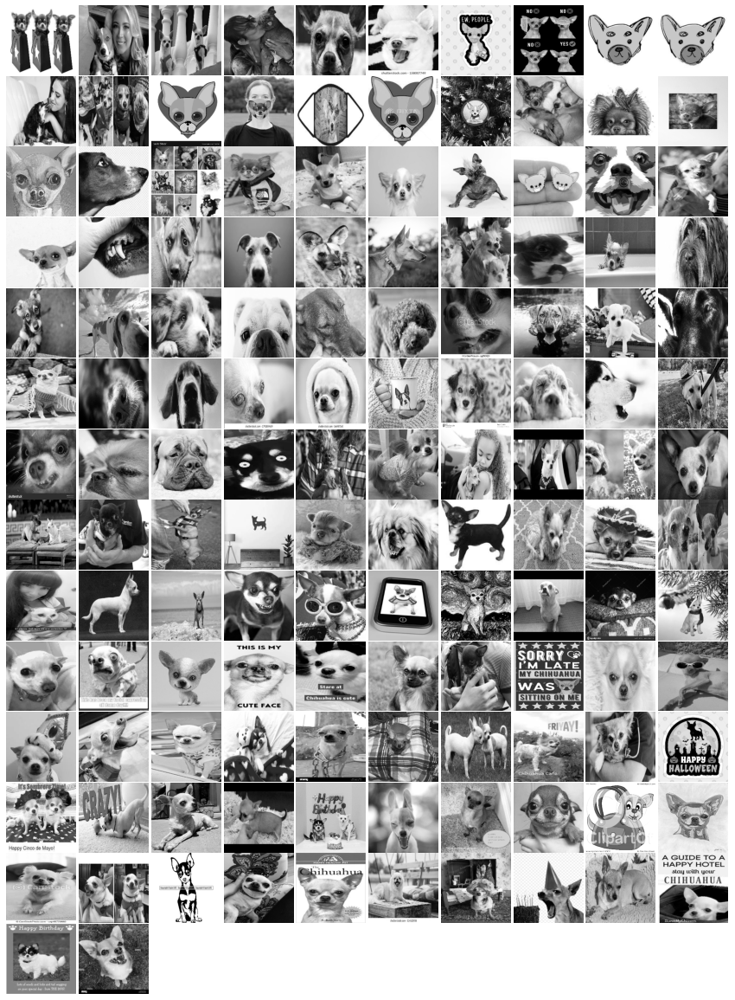

True Positive (508)


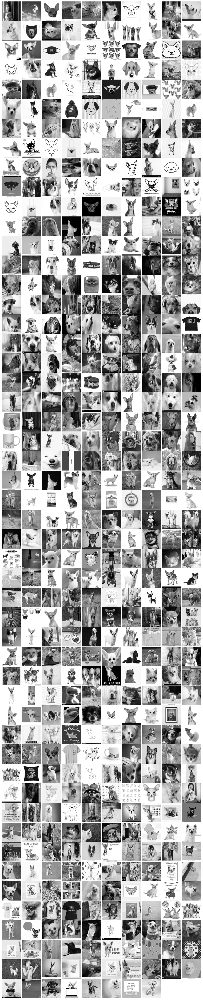

True Negative (406)


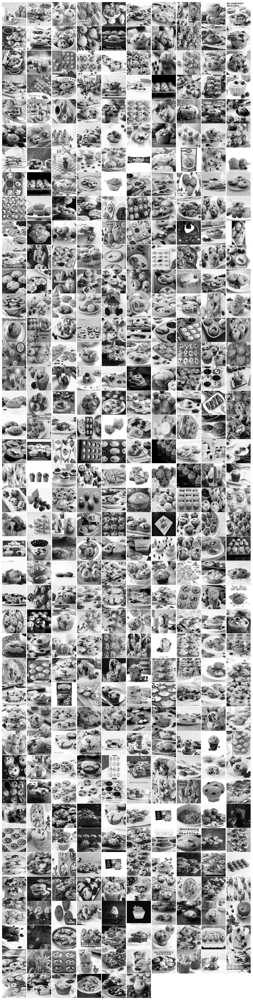

In [20]:
FP_X = X_test[(svm_preds != y_test)&(svm_preds == 1)]
FN_X = X_test[(svm_preds != y_test)&(svm_preds == 0)]
TP_X = X_test[(svm_preds == y_test)&(svm_preds == 1)]
TN_X = X_test[(svm_preds == y_test)&(svm_preds == 0)]

num_images = len(FP_X)
num_columns = 10
num_rows = int(np.ceil(num_images/num_columns))

fig, axes = plt.subplots(num_rows, num_columns, figsize=(num_columns * 1.5, num_rows * 1.5))
axes = axes.flatten()
for i in range(num_images):
    ax = axes[i]
    ax.imshow(FP_X[i].reshape((224,224)), cmap = 'gray')
    ax.axis('off')

for i in range(num_images, len(axes)):
    axes[i].axis('off')
print(f"False Positive ({len(FP_X)})")
plt.subplots_adjust(wspace=0.01, hspace=0.01)
plt.show()

num_images = len(FN_X)
num_columns = 10
num_rows = int(np.ceil(num_images/num_columns))

fig, axes = plt.subplots(num_rows, num_columns, figsize=(num_columns * 1.5, num_rows * 1.5))
axes = axes.flatten()
for i in range(num_images):
    ax = axes[i]
    ax.imshow(FN_X[i].reshape((224,224)), cmap = 'gray')
    ax.axis('off')

for i in range(num_images, len(axes)):
    axes[i].axis('off')
print(f"False Negative ({len(FN_X)})")
plt.subplots_adjust(wspace=0.01, hspace=0.01)
plt.show()

num_images = len(TP_X)
num_columns = 10
num_rows = int(np.ceil(num_images/num_columns))

fig, axes = plt.subplots(num_rows, num_columns, figsize=(num_columns * 1.5, num_rows * 1.5))
axes = axes.flatten()
for i in range(num_images):
    ax = axes[i]
    ax.imshow(TP_X[i].reshape((224,224)), cmap = 'gray')
    ax.axis('off')

for i in range(num_images, len(axes)):
    axes[i].axis('off')
print(f"True Positive ({len(TP_X)})")
plt.subplots_adjust(wspace=0.01, hspace=0.01)
plt.show()

num_images = len(TN_X)
num_columns = 10
num_rows = int(np.ceil(num_images/num_columns))

fig, axes = plt.subplots(num_rows, num_columns, figsize=(num_columns * 1.5, num_rows * 1.5))
axes = axes.flatten()
for i in range(num_images):
    ax = axes[i]
    ax.imshow(TN_X[i].reshape((224,224)), cmap = 'gray')
    ax.axis('off')

for i in range(num_images, len(axes)):
    axes[i].axis('off')
print(f"True Negative ({len(TN_X)})")
plt.subplots_adjust(wspace=0.01, hspace=0.01)
plt.show()

In [21]:
svm_cm = confusion_matrix(y_test, svm_preds)
svm_cm

array([[406, 138],
       [132, 508]], dtype=int64)

Confusion matrix for SVM

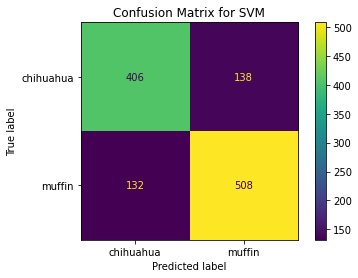

In [7]:
ConfusionMatrixDisplay(confusion_matrix=np.array([[406, 138], [132, 508]]), display_labels=['chihuahua', 'muffin']).plot()
plt.title("Confusion Matrix for SVM")
plt.show()

Confusion matrix for QDA

In [8]:
qda_cm = confusion_matrix(y_test, qda_preds)
qda_cm 

array([[501,  43],
       [240, 400]], dtype=int64)

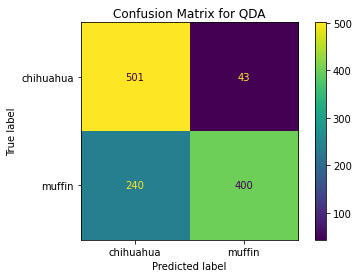

In [9]:
ConfusionMatrixDisplay(confusion_matrix=np.array([[501,  43], [240, 400]]), display_labels=['chihuahua', 'muffin']).plot()
plt.title("Confusion Matrix for QDA")
plt.show()

A simple CNN

In [44]:
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np

chihuahua_train_directory = "train/chihuahua"
muffins_train_directory = "train/muffin"

chihuahua_test_directory = "test/chihuahua"
muffins_test_directory = "test/muffin"

target_size = (224, 224)

def extract_color_image_np(img_dir, target_size):
    output = []
    for filename in os.listdir(img_dir):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            image_path = os.path.join(img_dir, filename)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            if image is not None:
                resized_image = cv2.resize(image, target_size)
                output.append(np.array(resized_image))
    return np.array(output)
            
chihuahua_train_color = extract_color_image_np(chihuahua_train_directory, target_size)
muffins_train_color = extract_color_image_np(muffins_train_directory, target_size)
X_train_color = np.concatenate((chihuahua_train_color, muffins_train_color), axis=0)
y_train_color = np.hstack((np.ones(chihuahua_train_color.shape[0]), np.zeros(muffins_train_color.shape[0])))
y_train_color = np.array([int(i) for i in y_train_color])
X_train_color_scaled = X_train_color/255

chihuahua_test_color = extract_color_image_np(chihuahua_test_directory, target_size)
muffins_test_color = extract_color_image_np(muffins_test_directory, target_size)
X_test_color = np.concatenate((chihuahua_test_color, muffins_test_color), axis=0)
y_test_color = np.hstack((np.ones(chihuahua_test_color.shape[0]), np.zeros(muffins_test_color.shape[0])))
y_test_color = np.array([int(i) for i in y_test_color])
X_test_color_scaled = X_test_color/255

In [52]:
from sklearn.model_selection import train_test_split
X_train_color_scaled, X_eval_color_scaled, y_train_color, y_eval_color_test = train_test_split(X_train_color_scaled, y_train_color, test_size=0.3, random_state=42)

In [55]:
# Build the CNN model
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
model.fit(X_train_color_scaled, y_train_color, epochs=10, validation_data=(X_eval_color_scaled, y_eval_color_test))

# Evaluate the model
test_loss, test_acc = model.evaluate(X_test_color_scaled, y_test_color, verbose=2)
print(f'Test accuracy: {test_acc}')

Epoch 1/10
104/104 [==============================] - 64s 604ms/step - loss: 0.7274 - accuracy: 0.5916 - val_loss: 0.5624 - val_accuracy: 0.7028
Epoch 2/10
104/104 [==============================] - 66s 632ms/step - loss: 0.5015 - accuracy: 0.7685 - val_loss: 0.3973 - val_accuracy: 0.8373
Epoch 3/10
104/104 [==============================] - 64s 618ms/step - loss: 0.3891 - accuracy: 0.8261 - val_loss: 0.3394 - val_accuracy: 0.8690
Epoch 4/10
104/104 [==============================] - 64s 611ms/step - loss: 0.2978 - accuracy: 0.8762 - val_loss: 0.3678 - val_accuracy: 0.8507
Epoch 5/10
104/104 [==============================] - 64s 612ms/step - loss: 0.2553 - accuracy: 0.9013 - val_loss: 0.3428 - val_accuracy: 0.8690
Epoch 6/10
104/104 [==============================] - 64s 618ms/step - loss: 0.1801 - accuracy: 0.9230 - val_loss: 0.3588 - val_accuracy: 0.8718
Epoch 7/10
104/104 [==============================] - 65s 624ms/step - loss: 0.1143 - accuracy: 0.9559 - val_loss: 0.6231 - val_ac

In [56]:
model.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_37 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 111, 111, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_38 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 54, 54, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_39 (Conv2D)          (None, 52, 52, 64)        36928     
                                                                 
 flatten_11 (Flatten)        (None, 173056)          